# Generating images using Amazon Titan Image Generator

> ☝️ This notebook should work well with the **`Data Science 3.0`** kernel in Amazon SageMaker Studio and with the **`conda_python3`** in a Amazon SageMaker Notebook Instance.

---

In this tutorial, we will show how to use the new [Amazon Titan Image Generator](https://docs.aws.amazon.com/bedrock/latest/userguide/titan-image-models.html) on [Amazon Bedrock](https://aws.amazon.com/bedrock/) model to generate (text-to-image) and edit (image-to-image) images.


However, there are certain templates that have been known to work.

Broadly, a prompt can be broken down into three pieces:

1. **Type** of image (photograph/sketch/painting/&c.)
2. **Description** of the content (subject/object/environment/scene/&c.), and
3. **Style** of the image (realistic/artistic/&c.).

You can change each of the three parts individually to generate variations of an image. 

Adjectives have been known to play a significant role in the image generation process. 

Also, adding more details help in the generation process.

In order to generate a **realistic** image, you can use phrases such as

```
a photo of
a photograph of
realistic
hyper realistic
```

To generate something more **artistic**, you can use phrases like

```
by Pablo Picasso
oil painting by Rembrandt
landscape art by Frederic Edwin Church
pencil drawing by Albrecht Dürer
```

You can also combine different artists as well.

To generate artistic images by category, you can add the art category in the prompt such as

```
lion on a beach, abstract
```

Some other categories include

```
oil painting
pencil drawing
pop art
digital art
anime
cartoon
futurism
watercolor
manga
&c.
```

You can also include details such as lighting or camera lens such as

```
35mm wide lens
85mm wide lens
```

and details about the framing

```
portrait
landscape
close up
&c.
```

Note that models can generate different images even if same prompt is given multiple times. 

So, you can generate multiple images and select the image that suits your application best.

> ☝️ For more information on Amazon Titan Image Generator prompt engineering, see [Amazon Titan Image Generator Prompt Engineering Best Practices](https://d2eo22ngex1n9g.cloudfront.net/Documentation/User+Guides/Titan/Amazon+Titan+Image+Generator+Prompt+Engineering+Guidelines.pdf). 

## Set Up

In [4]:
# Built-in libraries
import base64
import io
import json
import os
import sys

# External dependencies
import boto3
from PIL import Image
import botocore

boto3_bedrock = boto3.client('bedrock-runtime')

In [5]:
def image_to_base64(img) -> str:
    """Converts a PIL Image or local image file path to a base64 string"""
    if isinstance(img, str):
        if os.path.isfile(img):
            print(f"Reading image from file: {img}")
            with open(img, "rb") as f:
                return base64.b64encode(f.read()).decode("utf-8")
        else:
            raise FileNotFoundError(f"File {img} does not exist")
    elif isinstance(img, Image.Image):
        buffer = io.BytesIO()
        img.save(buffer, format="PNG")
        return base64.b64encode(buffer.getvalue()).decode("utf-8")
    else:
        raise ValueError(f"Expected str (filename) or PIL Image. Got {type(img)}")

### Use Cases Attempted in this notebook -

1. Text-to-image: Generate coffee machine on the brown wooden table with background of fireplace in modern house.

2. Image-to-image: Add background of ocean with waves crashing in through the window.

3. Image-to-image: Place teddy bear and box of cookies next to the coffee machine

4. Image-to-image: Change color of teddy to brown

### 1. Text-to-image: Generate coffee machine on the brown wooden table with background of fireplace in modern house.

Output: iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAAEAAElEQVR4nFT9y7IlSZIkiDGzqJqd4xFZ...


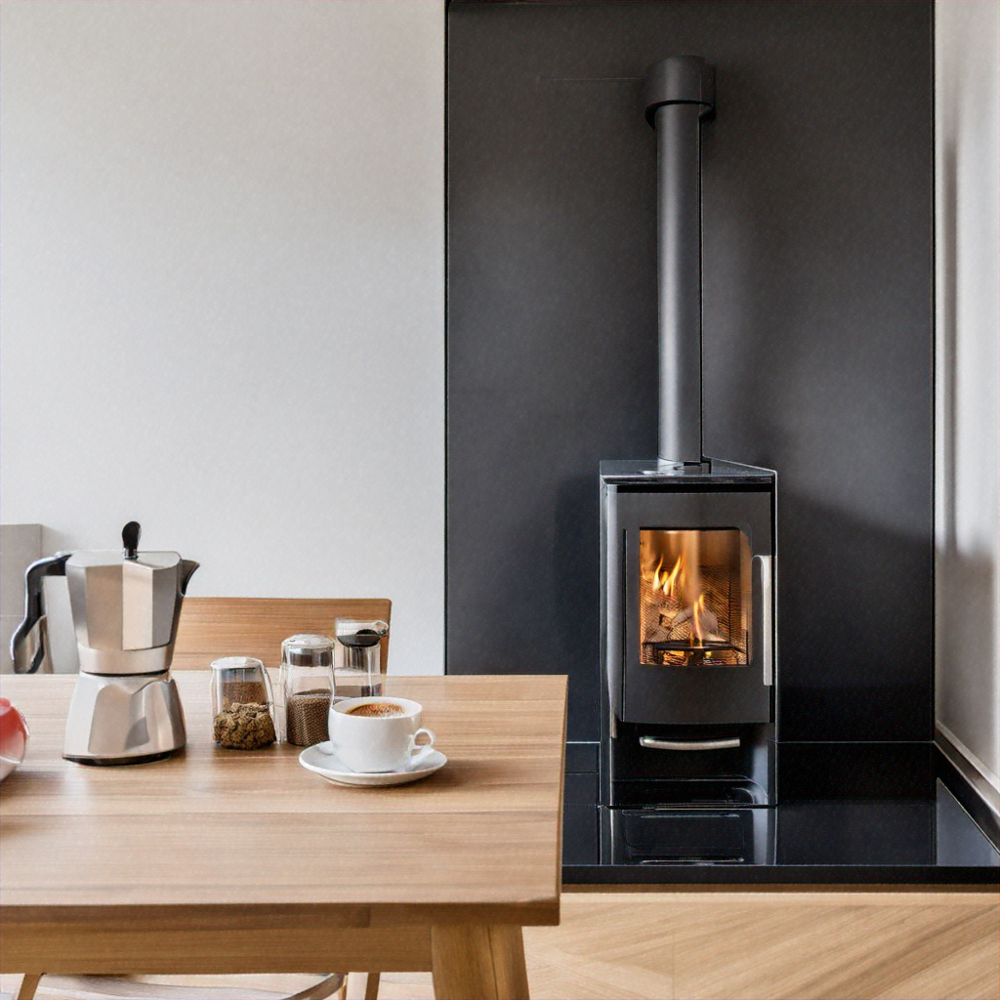

In [43]:
prompt="Modern Kitchen with wall facing straight from image. Wall has a modern small black color inviting fireplace with warm inviting fire.  In front of fireplace is a wooden table. On wooden table there is a small home coffee maker machine"
negative_prompts = "poorly rendered, poor background details,low resolution "

# Create payload
body = json.dumps(
    {
        "taskType": "TEXT_IMAGE",
        "textToImageParams": {
            "text": prompt,                    # Required
            "negativeText": negative_prompts   # Optional
        },
        "imageGenerationConfig": {
            "numberOfImages": 1,   # Range: 1 to 5 
            "quality": "premium",  # Options: standard or premium
            "height": 1024,        # Supported height list in the docs 
            "width": 1024,         # Supported width list in the docs
            "cfgScale": 8,       # Range: 1.0 (exclusive) to 10.0
            "seed":89086           # Range: 0 to 214783647
        }
    }
)

# Make model request
response = boto3_bedrock.invoke_model(
    body=body,
    modelId="amazon.titan-image-generator-v1",
    accept="application/json", 
    contentType="application/json"
)

# Process the image
response_body = json.loads(response.get("body").read())
coffee_machine2_b64 = response_body["images"][0]

# Debug
print(f"Output: {coffee_machine2_b64[0:80]}...")

os.makedirs("data/titan", exist_ok=True)

# Decode + save
coffee_machine2 = Image.open(
    io.BytesIO(
        base64.decodebytes(
            bytes(coffee_machine2_b64, "utf-8")
        )
    )
)
coffee_machine2.save(f"data/titan/coffee_machine2.png")

# Display
coffee_machine2

## 2. Image-to-image: Add background of ocean with waves crashing in through the window.

Output: iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAAEAAElEQVR4nHz9S89t27IlBrVoEX2MOb+1...


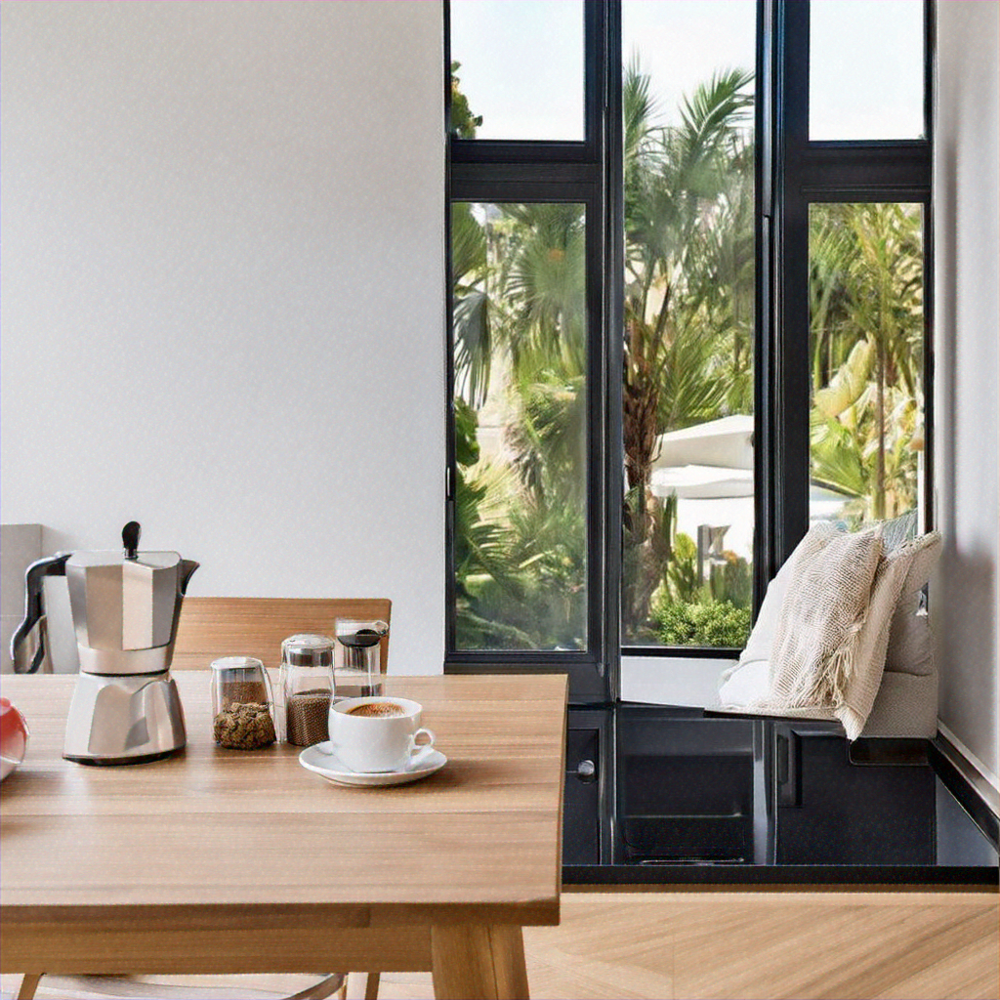

In [46]:
body = json.dumps(
    {
        "taskType": "INPAINTING",
        "inPaintingParams": {
            "text": "replace with wide window with wide ocean view",
            "negativeText": "poorly rendered, poor background details,low resolution ",
            "image": image_to_base64(Image.open("data/titan/coffee_machine2.png")),
            "maskPrompt": "black fireplace only",
            #"maskImage": image_to_base64(mask),
          #  "outPaintingMode": "DEFAULT"
        },
        "imageGenerationConfig": {
            "numberOfImages": 1,
            "quality": "standard",
            "cfgScale": 7.5,
            "seed": 896543,
        }
    }
)

# Model invocation
response = boto3_bedrock.invoke_model(
    body = body, 
    modelId = "amazon.titan-image-generator-v1",
    accept = "application/json", 
    contentType = "application/json"
)

# Output processing

response_body = json.loads(response.get("body").read())
ocean2_b64_str = response_body["images"][0]
print(f"Output: {ocean2_b64_str[0:80]}...")

# Decode + save
ocean2 = Image.open(
    io.BytesIO(
        base64.decodebytes(
            bytes(ocean2_b64_str, "utf-8")
        )
    )
)
ocean2.save(f"data/titan/ocean2_new.png")

# Display
ocean2


## 3. Image-to-image: Place teddy bear and box of cookies next to the coffee machine
Do in steps

Output: iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAAEAAElEQVR4nJT9y69tyZbmCf3GsGHT5lxr...


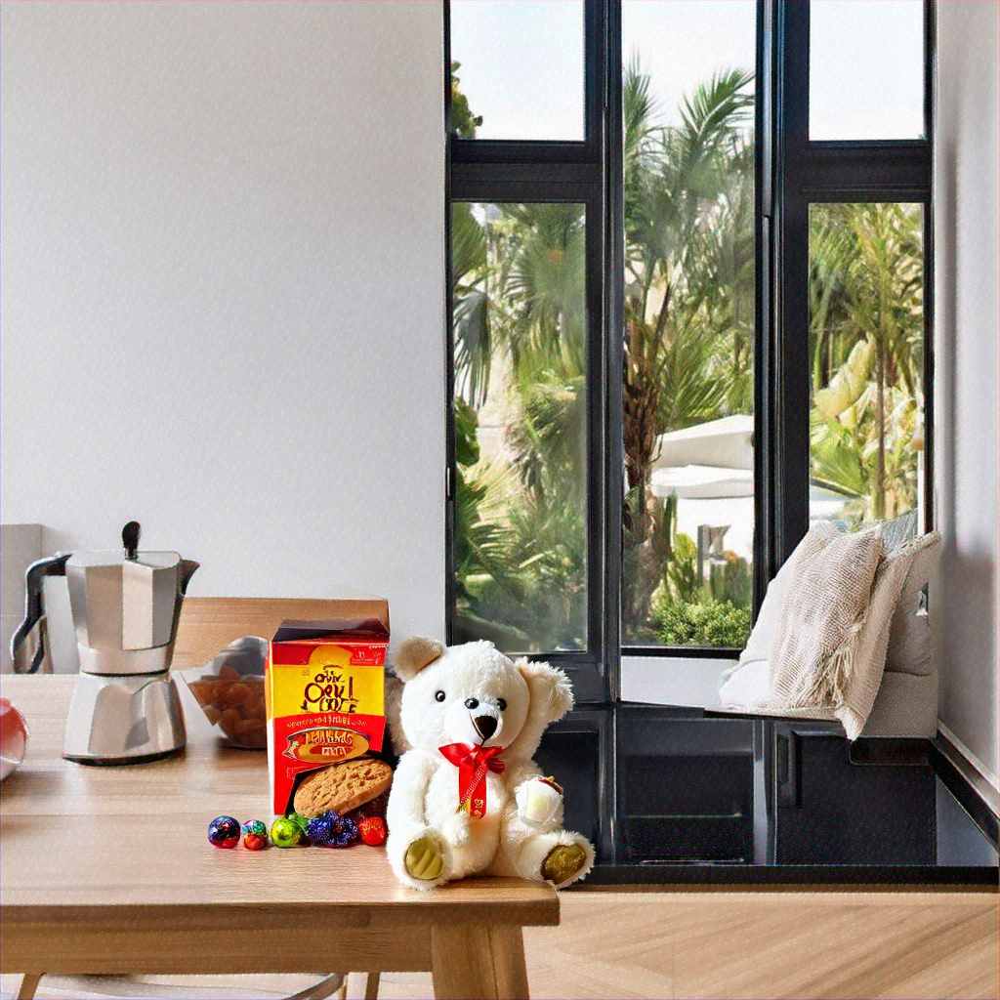

In [63]:
# Payload creation
body = json.dumps({
     "taskType": "INPAINTING",
        "inPaintingParams": {
            "text": "White colored small soft toy teddy bear Sitting  next to a cookie box",
            "negativeText": "poorly rendered, poor background details,low resolution",
            "image": image_to_base64(Image.open("data/titan/ocean2_new.png")),
          #  "maskPrompt": "tea cup with plate and all jars",
            "maskImage": image_to_base64(Image.open("data/titan/mask.png")),
          #  "outPaintingMode": "DEFAULT"
        },
        "imageGenerationConfig": {
            "numberOfImages": 1,
            "quality": "standard",
            "cfgScale": 7.5,
            "seed": 211668436,
        }
 })

# Model invocation
response = boto3_bedrock.invoke_model(
    body=body,
    modelId="amazon.titan-image-generator-v1",
    accept="application/json", 
    contentType="application/json"
)

# Output processing
response_body = json.loads(response.get("body").read())
img_bear_variation_b64 = response_body["images"][0]

# Debug
print(f"Output: {img_bear_variation_b64[0:80]}...")

# Decode + save
img_bear_var = Image.open(
    io.BytesIO(
        base64.decodebytes(
            bytes(img_bear_variation_b64, "utf-8")
        )
    )
)
img_bear_var.save("data/titan/bear_image_variation.png")

# Display
img_bear_var

## 4. Image-to-image: Change color of teddy to brown

Output: iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAAEAAElEQVR4nJz9S8wty3Xnif1iRURGxs79...


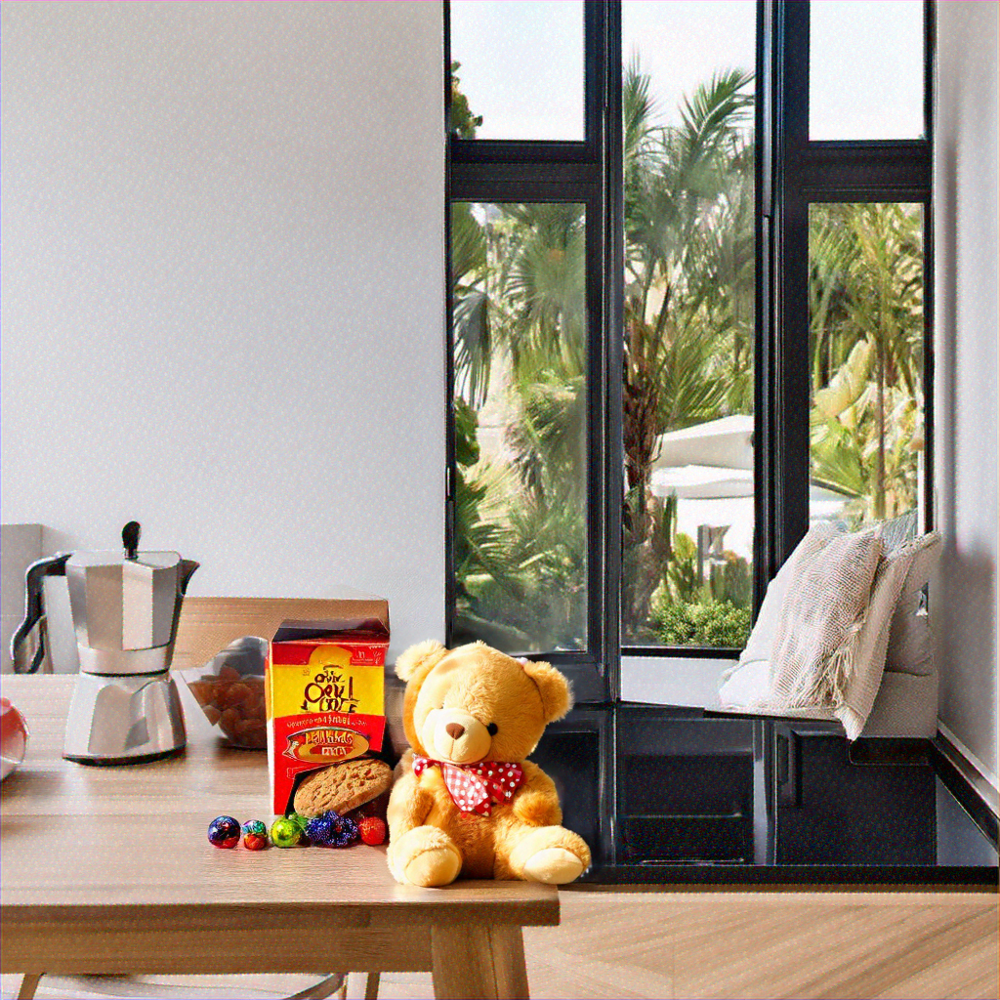

In [64]:
# Payload creation
prompt="same size and style teddy bear in brown color"
#negative_prompts = "poorly rendered, poor background details, poorly drawn windows, low resolution "
body = json.dumps(
    {
        "taskType": "INPAINTING",
        "inPaintingParams": {
            "text": prompt,
         #   "negativeText": "white color anywhere on teddy bear",
            "image": img_bear_variation_b64,
            "maskPrompt": "teddy bear",
            #"maskImage": image_to_base64(Image.open("data/titan/mask-mik.png"))            
        },
        "imageGenerationConfig": {
            "numberOfImages": 3,
            "quality": "standard",
            "cfgScale": 8,
            "seed": 50,
            "height": 1024,
            "width": 1024
        }
    }
)

# Model invocation
response = boto3_bedrock.invoke_model(
    body = body, 
    modelId = "amazon.titan-image-generator-v1",
    accept = "application/json", 
    contentType = "application/json"
)

# Output processing
response_body=[]
response_body = json.loads(response.get("body").read())
milk_bearred_b64_str = response_body["images"][0]
print(f"Output: {milk_bearred_b64_str[0:80]}...")

# Decode + save
milk_bearred_newP = Image.open(
    io.BytesIO(
        base64.decodebytes(
            bytes(milk_bearred_b64_str, "utf-8")
        )
    )
)
milk_bearred_newP.save(f"data/titan/milkWithBearRed.png")

# Display
milk_bearred_newP